## 2-4-2 : Deep Q Networks

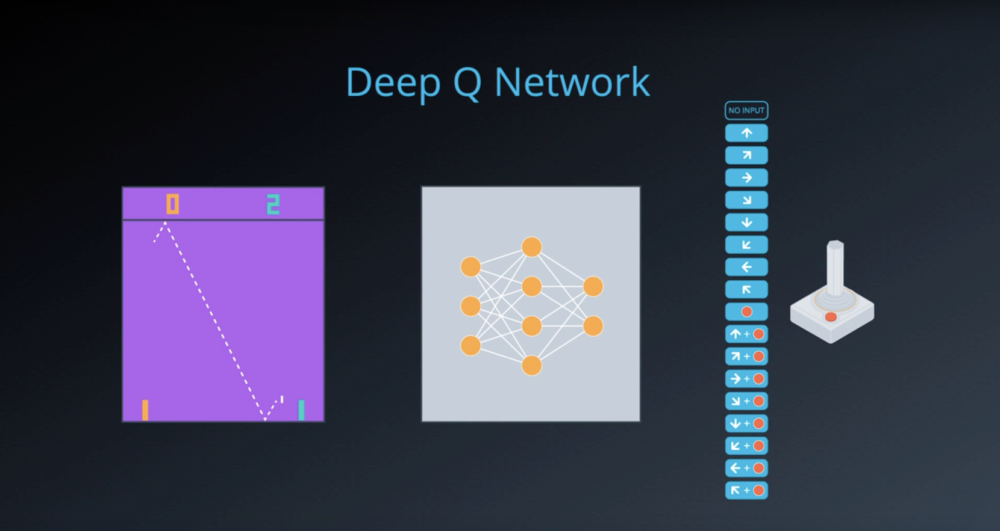

In [8]:
from IPython.display import Image
Image(filename='./images/2-4-2-1_dqn_function_approximator.png')

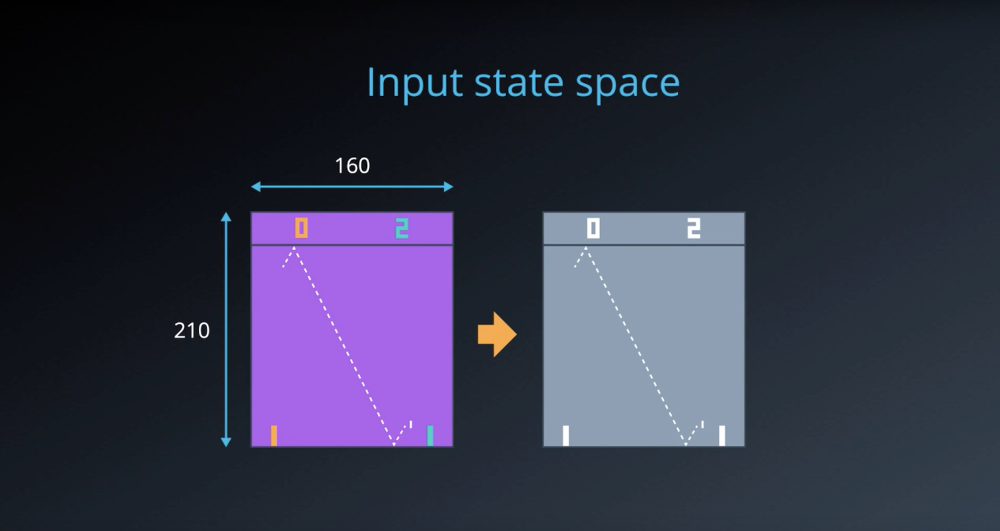

In [9]:
from IPython.display import Image
Image(filename='./images/2-4-2-2_dqn_input_state_space.png')

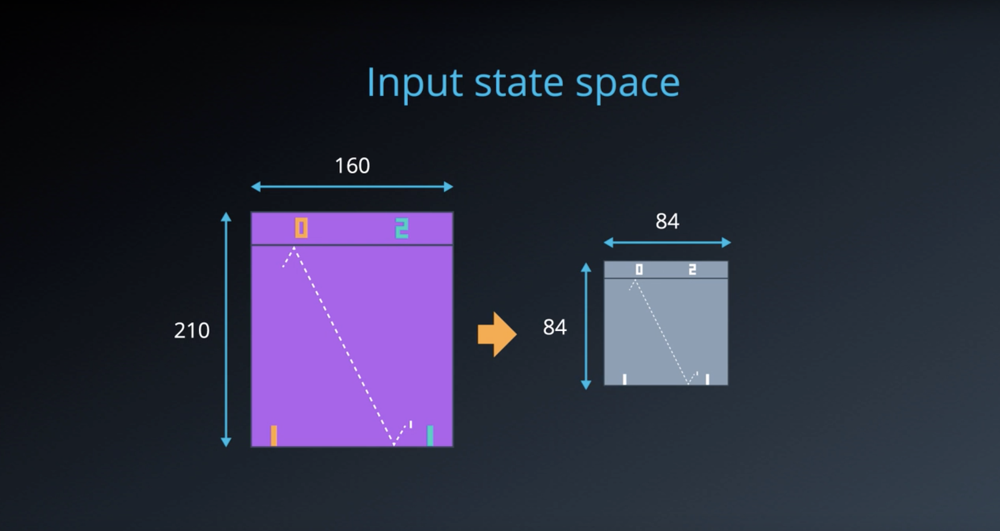

In [10]:
from IPython.display import Image
Image(filename='./images/2-4-2-3_dqn_input_state_space_preprocessing.png')

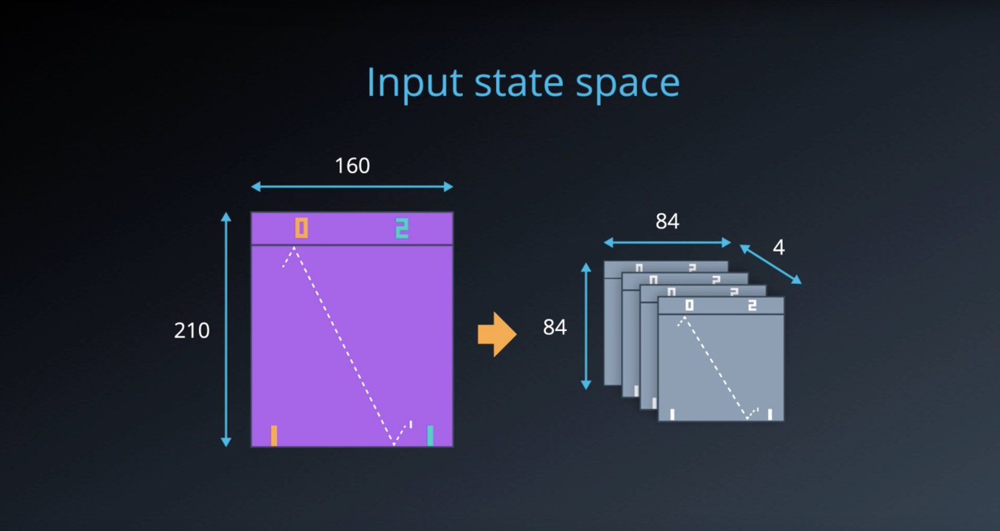

In [11]:
from IPython.display import Image
Image(filename='./images/2-4-2-4_dqn_input_state_space_preprocessing_to_capture_temporal_information.png')

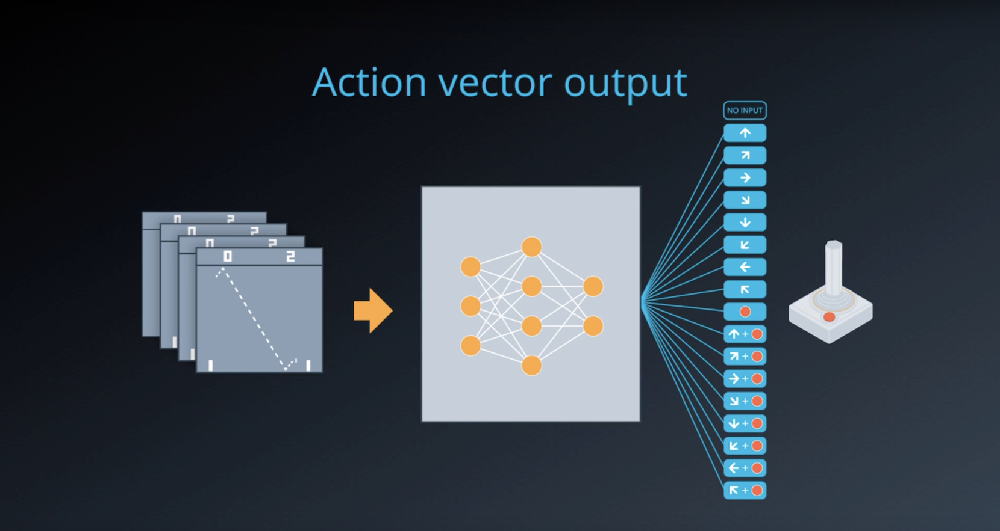

In [12]:
from IPython.display import Image
Image(filename='./images/2-4-2-5_dqn_action_vetor_output.png')

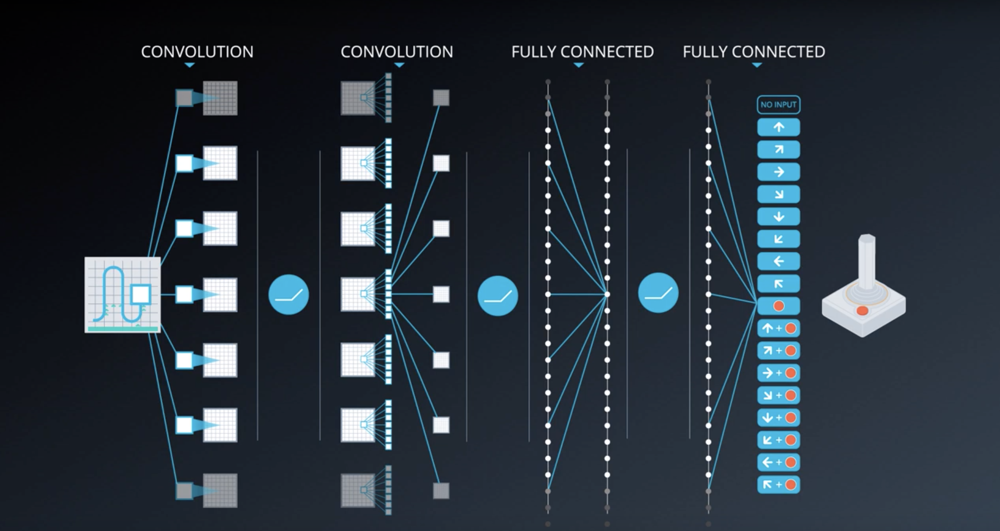

In [13]:
from IPython.display import Image
Image(filename='./images/2-4-2-6_dqn_with_cnn_and_fcn.png')

## Quiz

Select all that are true.

1. The Deep Q-Network (DQN) receives the most recent state of the game as input. After some preprocessing, this is the 84x84x1 (grayscale) game screen.
2. In order to capture temporal information, a stack of 4 preprocessed frames are used as the state that is passed to the DQN.
3. The DQN takes a state and action as input, and returns the corresponding predicted action value.
4. The DQN takes the state as input, and returns the corresponding predicted action values for each possible game action.
5. The DQN was provided information about the game of pong - before the agent started learning, the researchers wrote helper functions to ensure the agent always keeps the paddle close to the ball.
6. The DQN architecture included a combination of convolutional and recurrent layers. The CNN component captures spatial information in the state, and the RNN component detects temporal patterns.
7. The DQN architecture is fully convolutional: it has only convolutional layers and no fully-connected layers.
8. The DQN architecture is composed of a couple of convolutional layers, followed by a couple of fully connected layers.
9. For each Atari game, the DQN was trained from scratch on that game.
10. The DQN was trained on data from the first several games, and then with that knowledge (and no additional training), it could beat the remaining Atari games.

- Answer : 2, 4, 8, 9

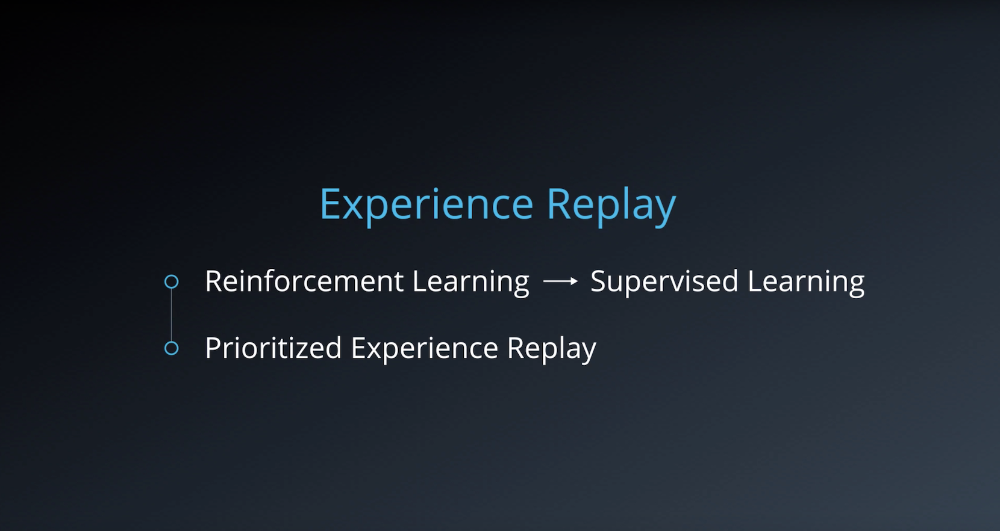

In [32]:
from IPython.display import Image
Image(filename='./images/2-4-3-19_dqn_experience_replay_means_sl_approach_and prioritized_experience_replay.png')

## Summary of Experience Replay

When the agent interacts with the environment, the sequence of experience tuples can be highly correlated. The naive Q-learning algorithm that learns from each of these experience tuples in sequential order runs the risk of getting swayed by the effects of this correlation. By instead keeping track of a **replay buffer** and using **experience replay** to sample from the buffer at random, we can prevent action values from oscillating or diverging catastrophically.

The **replay buffer** contains a collection of experience tuples (S, A, R, S′). The tuples are gradually added to the buffer as we are interacting with the environment.

The act of sampling a small batch of tuples from the replay buffer in order to learn is known as **experience replay**. In addition to breaking harmful correlations, experience replay allows us to learn more from individual tuples multiple times, recall rare occurrences, and in general make better use of our experience.

## Quiz

Which of the following are true? Select all that apply.

1. Experience replay is based on the idea that we can learn better, if we do multiple passes over the same experience.
2. Experience replay causes harmful correlations and can cause lead to action-value estimates that fail to converge while training.
3. Experience replay is used to generate uncorrelated experience data for online training of deep RL agents.
4. Once an experience tuple is randomly sampled from the replay buffer, the agent learns from it, and then it is discarded from the buffer.

- Answer : 1, 3

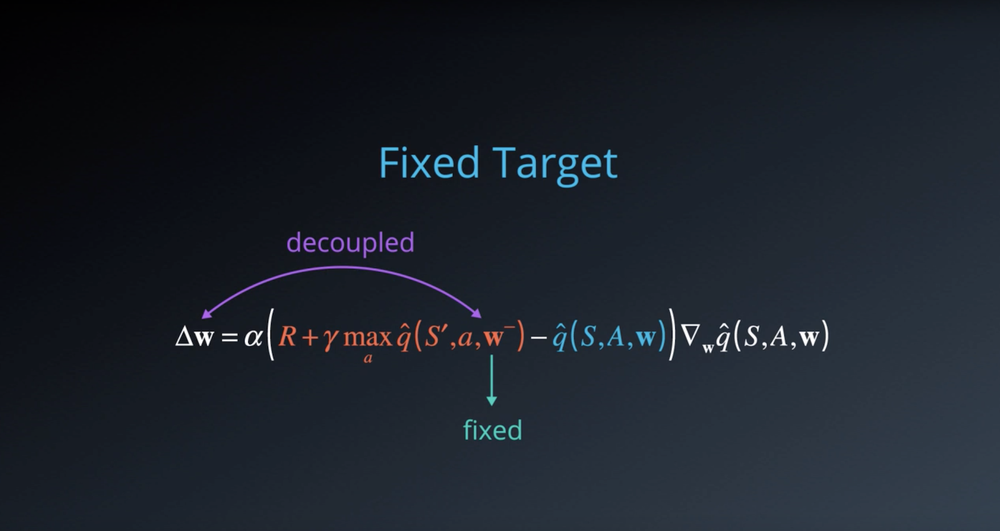

In [48]:
from IPython.display import Image
Image(filename='./images/2-4-4-15_dqn_fiexed_Q-Targets_decoupled.png')

## Summary of Fixed Q-Targets

In Q-Learning, we update a guess with a guess, and this can potentially lead to harmful correlations. To avoid this, we can update the parameters w in the network q^ to better approximate the action value corresponding to state S and action A with the following update rule:

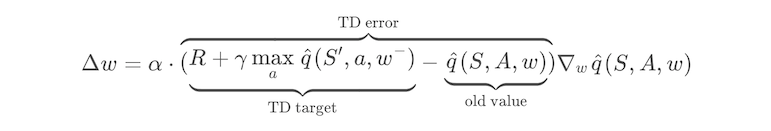

In [49]:
from IPython.display import Image
Image(filename='./images/2-4-4-16_dqn_fiexed_Q-Targets_equation.png')

### where w− are the weights of a separate target network that are not changed during the learning step, and (S, A, R, S′) is an experience tuple.

## Quiz

Which of the following are true? Select all that apply.

1. The Deep Q-Learning algorithm uses two separate networks with identical architectures.
2. The Deep Q-Learning algorithm uses two separate networks with different architectures.
3. Every time we update the primary Q-Network, we immediately update the target Q-Network weights, so that they match after each learning step.
4. The target Q-Network's weights are updated less often (or more slowly) than the primary Q-Network.
5. Without fixed Q-targets, we would encounter a harmful form of correlation, whereby we shift the parameters of the network based on a constantly moving target.


- Answer : 1, 4, 5

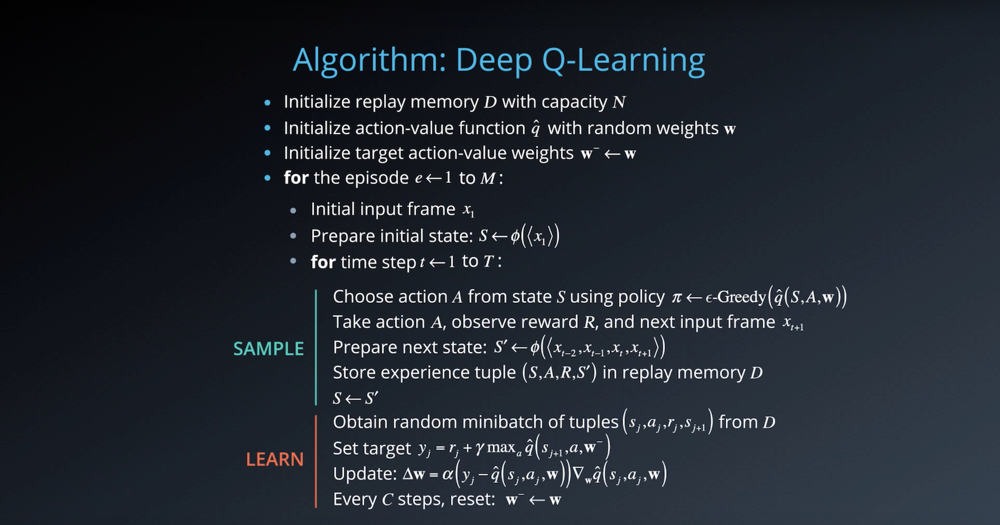

In [56]:
from IPython.display import Image
Image(filename='./images/2-4-5-7_dqn_algorithm_step7.png')

for each episode and each time step t within that episode you observe a raw screen image or input frame Xt which you need to convert to grayscale crop to a square size, etc.. Also, in order to capture temporal relationships you can stack a few input frames to build each state vector.

Let's denote this pre-processing and stacking operation by the function phi, which takes a sequence of frames and produces some combined representation.

Note that if we want to stack say four frames will have to do something special for the first, three time steps.
For instance, we can treat those missing frames as blank, or just used copies of the first frame, or we can just skip storing the experience tuples till we get a complete sequence.

In practice, you won't be able to run the learning step immediately. You will need to wait till you have sufficient number of tuples in memory.

Note that we do not clear out the memory after each episode, this enables us to recall and build batches of experiences from across episodes.

There are many other techniques and optimizations that are used in the DQN paper, such as 
- reward clipping
- error clipping
- storing past actions as part of the state vector
- dealing with terminal states
- digging epsilon over time
- et cetera.
